# Artificial Neural Networks and Deep Learning Challenge 2: 

---
In this assignment, we built a model to do image segmantation on 64x128 grayscale real images from Mars terrain. Pixels in these images are categorized into five classes, each representing a particular type of terrain. This is a semantic segmentation problem, so the goal is to assign the correct class label to each mask pixel.

---
## How to run with this notebook
Follow these steps:
- If in Colab:
0. This notebook is expected to be opened and executed from a Google Drive folder called `ANNDL-challenge2`, which should also contain the `mars_for_students.npz` file
1. Create a folder named `ANNDL Challenge` in your Google Drive.
2. Upload the `mars_for_students.npz` file to this folder.
3. Upload and run this notebook.

- If in Kaggle:
0. This notebook is expected to be executed from Kaggle
1. Upload the `mars-for-students/mars_for_students.npz` file to Kaggle.
2. Run this notebook.


To make a submission, follow these steps:
1. Submit the generated `.csv` file to Kaggle.

## Settings Variables

In [1]:
# Set to True or False to run this notebook, respectively, on Colab or Kaggle
IS_COLAB = False

# Seed for Randomness
SEED = 42

# Name of the file for plotting validation/test accuracy and loss of all the models trained in the past
#METADATA_FILE = 'best-metadata.pkl'

# Set Dataset path
if IS_COLAB :
    DATA_FILE = 'mars_for_students.npz'
else:
    # (Kaggle) Dataset file path
    DATA_FILE = '/kaggle/input/mars-forstudents/mars_for_students.npz'

## 🌐 Connect Colab to Google Drive

In [3]:
if IS_COLAB:
    from google.colab import drive
    
    drive.mount("/gdrive")
    %cd /gdrive/My Drive/ANNDL-challenge2

## ⚙️ Import Libraries

In [37]:
from datetime import datetime
import random
import os

os.environ["SM_FRAMEWORK"] = "tf.keras"

import numpy as np
import pandas as pd

import tensorflow as tf
from tensorflow import keras as tfk
from tensorflow.keras import layers as tfkl

import albumentations as A
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score

import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
%matplotlib inline

np.random.seed(SEED)
tf.random.set_seed(SEED)

print(f"TensorFlow version: {tf.__version__}")
print(f"Keras version: {tfk.__version__}")
print(f"GPU devices: {len(tf.config.list_physical_devices('GPU'))}")

TensorFlow version: 2.16.1
Keras version: 3.3.3
GPU devices: 1


## ⏳ Load the Data

In [5]:
data = np.load(DATA_FILE)

training_set = data["training_set"]
X_train_val = training_set[:, 0]
y_train_val = training_set[:, 1]

X_test = data["test_set"]

print(f"Training validation X shape: {X_train_val.shape}")
print(f"Training validation y shape: {y_train_val.shape}")
print(f"Test X shape: {X_test.shape}")

# Define labels for the classes
labels = {0: "Background", 1: "Soil", 2: "Bedrock", 3: "Sand", 4: "Big Rock"}
num_classes = len(labels)

Training validation X shape: (2615, 64, 128)
Training validation y shape: (2615, 64, 128)
Test X shape: (10022, 64, 128)


In [6]:
y_first_alien = y_train_val[62]

alien_mask = np.all(y_train_val == y_first_alien, axis=(1, 2))

X_train_val_aliens = X_train_val[alien_mask]
y_train_val_aliens = y_train_val[alien_mask]

print(f"Alien training validation X shape: {X_train_val_aliens.shape}")
print(f"Alien training validation y shape: {y_train_val_aliens.shape}")

Alien training validation X shape: (110, 64, 128)
Alien training validation y shape: (110, 64, 128)


In [7]:
def create_colormap(num_classes):
    # Generate a colormap for the classes
    return plt.cm.get_cmap("viridis", num_classes)

def plot_images(X, y):
    if len(X) != len(y):
        raise Exception("X and y should have the same length")

    num_images = len(X)
    fig, axes = plt.subplots(2, num_images, figsize=(num_images, 2))

    colormap = create_colormap(num_classes)

    # Create legend handles
    legend_handles = [mpatches.Patch(color=colormap(i), label=labels[i]) for i in range(num_classes)]

    # Display some images
    for i in range(num_images):
        ax0 = axes[0][i]
        ax0.imshow(X[i], cmap='gray')
        ax0.set_xticks([])
        ax0.set_yticks([])
        ax1 = axes[1][i]
        ax1.imshow(y[i], cmap=colormap, vmin=0, vmax=num_classes-1)
        ax1.set_xticks([])
        ax1.set_yticks([])

    # Add the legend
    fig.legend(handles=legend_handles, loc="upper left")

    plt.tight_layout()
    plt.show()

In [8]:
#plot_images(X_train_val_aliens, y_train_val_aliens)

In [9]:
X_train_val_cleaned = X_train_val[np.logical_not(alien_mask)]
y_train_val_cleaned = y_train_val[np.logical_not(alien_mask)]

print(f"Cleaned training validation X shape: {X_train_val_cleaned.shape}")
print(f"Cleaned training validation y shape: {y_train_val_cleaned.shape}")

Cleaned training validation X shape: (2505, 64, 128)
Cleaned training validation y shape: (2505, 64, 128)


/tmp/ipykernel_23/837677969.py:3: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  return plt.cm.get_cmap("viridis", num_classes)


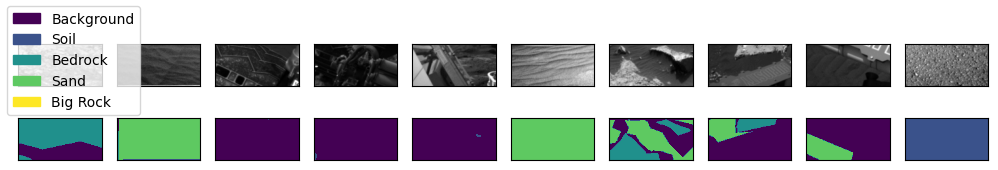

In [10]:
start_idx = 0
img_to_show = 10

end_idx = min(start_idx + img_to_show, len(X_train_val_cleaned))

plot_images(X_train_val_cleaned[start_idx:end_idx], y_train_val_cleaned[start_idx:end_idx])

# Visualize Class Distribution

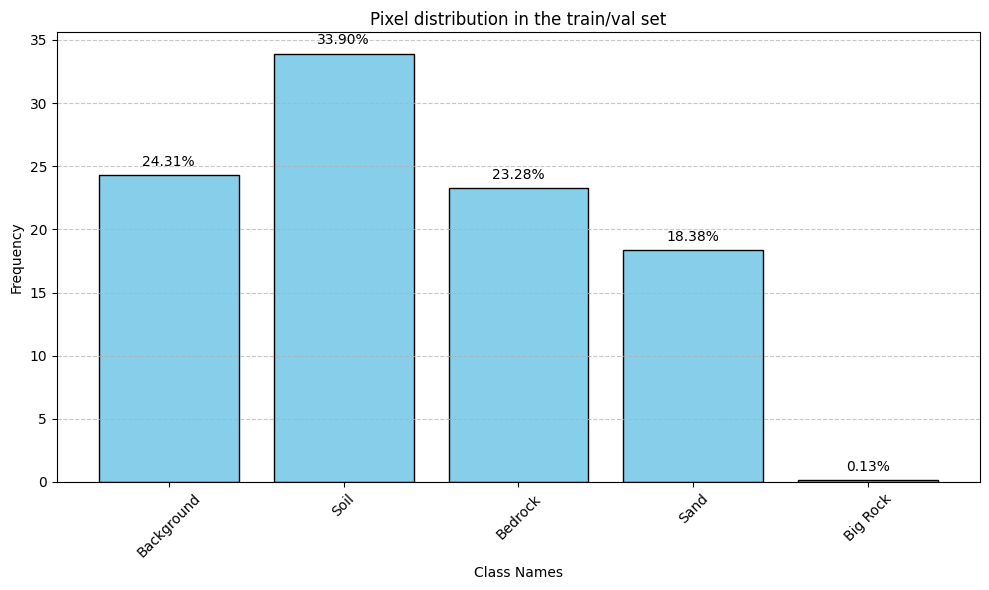

In [11]:
# The frequencies are calculated based on the number of pixels in the dataset that belong to each class.
def visualize_class_distribution(y_labels, labels, dataset="dataset"):
    """
    Visualizes the class distribution in the dataset.

    Args:
        y_labels (numpy.ndarray): Array of ground truth labels for the dataset.
        labels (dict): Dictionary mapping class indices to class names.
    """
    # Flatten the label array to count occurrences
    flattened_labels = y_labels.flatten()

    # Count occurrences of each class
    unique_classes, class_counts = np.unique(flattened_labels, return_counts=True)

    # Calculate the percentage for each class
    total_pixels = len(flattened_labels)
    class_percentages = (class_counts / total_pixels) * 100

    # Map class indices to class names
    class_names = [labels[class_idx] for class_idx in unique_classes]

    # Plot the distribution
    plt.figure(figsize=(10, 6))
    bars = plt.bar(class_names, class_percentages, color='skyblue', edgecolor='black')

    # Add percentage annotations above each bar
    for bar, percentage in zip(bars, class_percentages):
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width() / 2, yval + 0.5, f'{percentage:.2f}%', 
                 ha='center', va='bottom', fontsize=10, color='black')
    
    plt.xlabel("Class Names")
    plt.ylabel("Frequency")
    plt.title(f"Pixel distribution in the {dataset}")
    plt.xticks(rotation=45)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

# Call the function to visualize the class distribution
visualize_class_distribution(y_train_val_cleaned, labels, dataset="train/val set")

## Find and Augment Images with Big Rocks

In [12]:
# Define the class index for "Big Rocks"
BIG_ROCK_CLASS = 4

# Minimum percentage of "Big Rocks" pixels that an image must contain
BIG_ROCK_THRESHOLD = 1

total_pixels = y_train_val_cleaned.shape[1] * y_train_val_cleaned.shape[2]
big_rock_pixel_counts = np.sum(y_train_val_cleaned == BIG_ROCK_CLASS, axis=(1, 2))
big_rock_pixel_percentages = big_rock_pixel_counts / total_pixels * 100

big_rock_mask = np.where(big_rock_pixel_percentages >= BIG_ROCK_THRESHOLD)[0]
others_mask = np.where(big_rock_pixel_percentages < BIG_ROCK_THRESHOLD)[0]

# Filter the images and their corresponding labels
X_big_rocks = X_train_val_cleaned[big_rock_mask]
y_big_rocks = y_train_val_cleaned[big_rock_mask]

X_others = X_train_val_cleaned[others_mask]
y_others = y_train_val_cleaned[others_mask]

# Print the results
print(f"Shape of 'Big Rock' images array: {X_big_rocks.shape}")
print(f"Shape of 'Big Rock' labels array: {y_big_rocks.shape}")
print(f"Shape of 'Others' images array: {X_others.shape}")
print(f"Shape of 'Others' labels array: {y_others.shape}")

Shape of 'Big Rock' images array: (47, 64, 128)
Shape of 'Big Rock' labels array: (47, 64, 128)
Shape of 'Others' images array: (2458, 64, 128)
Shape of 'Others' labels array: (2458, 64, 128)


/tmp/ipykernel_23/813126376.py:13: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = plt.cm.get_cmap("viridis", num_classes)


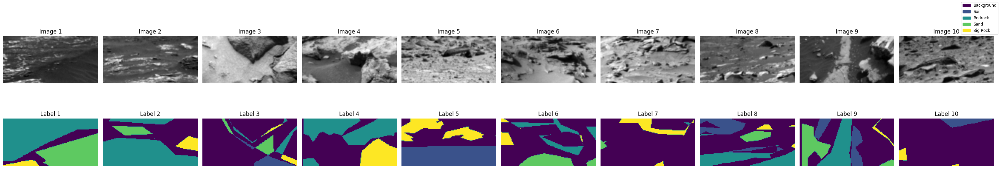

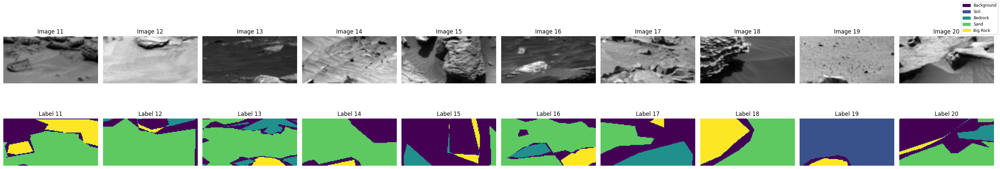

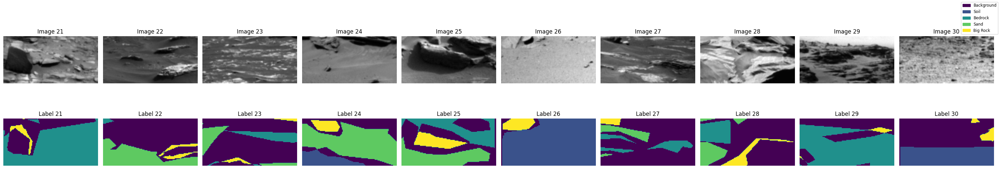

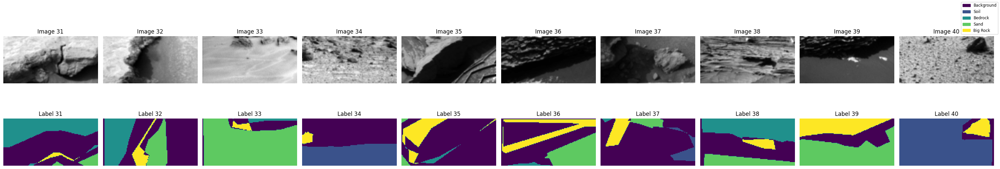

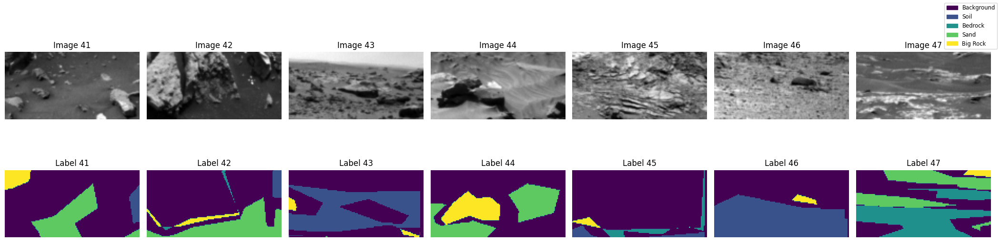

In [13]:
def plot_big_rocks_batches(X_big_rocks, y_big_rocks, batch_size=10, num_classes=num_classes, labels=labels):
    """
    Plot all the found 'Big Rocks' images along with their labels in batches.

    Args:
    - X_big_rocks: Array of 'Big Rocks' images.
    - y_big_rocks: Array of corresponding 'Big Rocks' masks.
    - batch_size: Number of images to display in each batch.
    - num_classes: Total number of classes for the colormap.
    - labels: Dictionary of class labels for the legend.
    """
    total_images = len(X_big_rocks)
    colormap = plt.cm.get_cmap("viridis", num_classes)
    legend_handles = [mpatches.Patch(color=colormap(i), label=labels[i]) for i in range(num_classes)]

    for start_idx in range(0, total_images, batch_size):
        end_idx = min(start_idx + batch_size, total_images)
        
        fig, axes = plt.subplots(2, end_idx - start_idx, figsize=(3 * (end_idx - start_idx), 6))
        
        for i, idx in enumerate(range(start_idx, end_idx)):
            # Plot the image
            ax_image = axes[0, i]
            ax_image.imshow(X_big_rocks[idx].squeeze(), cmap="gray")
            ax_image.axis("off")
            ax_image.set_title(f"Image {idx+1}")

            # Plot the label
            ax_label = axes[1, i]
            ax_label.imshow(y_big_rocks[idx], cmap=colormap, vmin=0, vmax=num_classes-1)
            ax_label.axis("off")
            ax_label.set_title(f"Label {idx+1}")

        # Add legend to the plot
        fig.legend(handles=legend_handles, loc="upper right", fontsize="small")
        plt.tight_layout()
        plt.show()

# Call the function to plot the 'Big Rocks' images in batches
plot_big_rocks_batches(X_big_rocks, y_big_rocks)

In [14]:
# augmentation pipeline of big rocks
big_rocks_augment = A.Compose(
    [
        A.Affine(p=0.66),
        A.RandomScale(scale_limit=0.4, p=0.5),  # Geometric
        A.HorizontalFlip(p=0.5),  # Geometric
        A.VerticalFlip(p=0.5),  # Geometric
        A.Resize(height=64, width=128), 
    ],
    additional_targets={'mask': 'mask'}  # Ensure masks are transformed alongside images
)

# Number of duplicates per image
AUGMENTATIONS_PER_IMAGE = 24

# Initialize lists for duplicate images and masks
X_big_rocks_augmented = []
y_big_rocks_augmented = []

for i in range(len(X_big_rocks)):
    for _ in range(AUGMENTATIONS_PER_IMAGE):
        augmented = big_rocks_augment(image=X_big_rocks[i].astype(np.uint8), mask=y_big_rocks[i].astype(np.uint8))
        X_big_rocks_augmented.append(augmented["image"])
        y_big_rocks_augmented.append(augmented["mask"])

# Convert lists to numpy arrays
X_big_rocks_augmented = np.array(X_big_rocks_augmented)
y_big_rocks_augmented = np.array(y_big_rocks_augmented)

# Print the results
print(f"Original 'Big Rocks' images: {len(X_big_rocks)}")
print(f"Augmented 'Big Rocks' images: {X_big_rocks_augmented.shape}")
print(f"Augmented 'Big Rocks' masks: {y_big_rocks_augmented.shape}")

Original 'Big Rocks' images: 47
Augmented 'Big Rocks' images: (1128, 64, 128)
Augmented 'Big Rocks' masks: (1128, 64, 128)


/tmp/ipykernel_23/3465166675.py:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = plt.cm.get_cmap("viridis", num_classes)


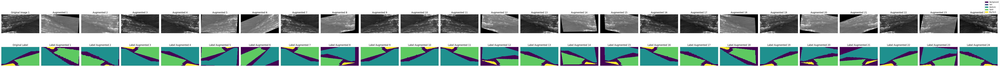

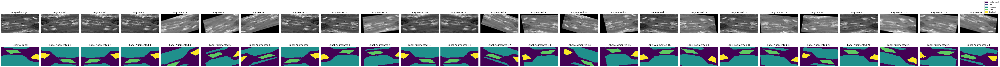

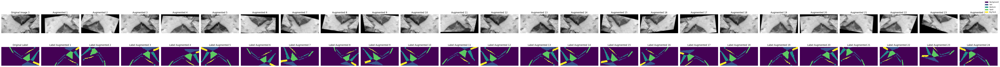

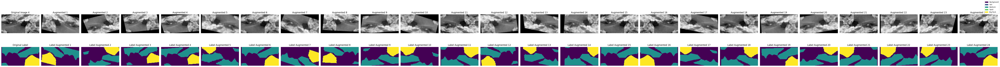

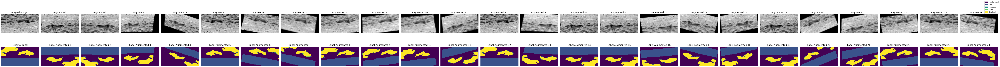

In [15]:
def plot_augmented_big_rocks(
    X_big_rocks, y_big_rocks, 
    X_big_rocks_augmented, y_big_rocks_augmented, 
    augmentations_per_image=AUGMENTATIONS_PER_IMAGE, 
    num_classes=num_classes, labels=labels, n_images=None
):
    """
    Plot all the original 'Big Rock' images along with their augmented versions and corresponding labels in batches.

    Args:
    - X_big_rocks: Array of original 'Big Rocks' images.
    - y_big_rocks: Array of corresponding original 'Big Rocks' masks.
    - X_big_rocks_augmented: Array of augmented 'Big Rocks' images.
    - y_big_rocks_augmented: Array of corresponding augmented 'Big Rocks' masks.
    - augmentations_per_image: Number of augmentations per original image.
    - batch_size: Number of images to display in each batch (including original + augmentations).
    - num_classes: Total number of classes for the colormap.
    - labels: Dictionary of class labels for the legend.
    """
    colormap = plt.cm.get_cmap("viridis", num_classes)
    legend_handles = [mpatches.Patch(color=colormap(i), label=labels[i]) for i in range(num_classes)]

    batch_size = augmentations_per_image + 1
    total_images = len(X_big_rocks) if n_images is None else n_images

    for img_idx in range(0, total_images):
        fig, axes = plt.subplots(2, batch_size, figsize=(3 * batch_size, 6))
        
        # Original image and mask
        axes[0, 0].imshow(X_big_rocks[img_idx].squeeze(), cmap="gray")
        axes[0, 0].set_title(f"Original Image {img_idx+1}")
        axes[0, 0].axis("off")
        
        axes[1, 0].imshow(y_big_rocks[img_idx], cmap=colormap, vmin=0, vmax=num_classes - 1)
        axes[1, 0].set_title("Original Label")
        axes[1, 0].axis("off")

        # Augmented images and masks
        for aug_idx in range(augmentations_per_image):
            aug_start_idx = img_idx * augmentations_per_image
            aug_img_idx = aug_start_idx + aug_idx
            
            if aug_idx >= batch_size - 1:
                break

            axes[0, aug_idx + 1].imshow(X_big_rocks_augmented[aug_img_idx].squeeze(), cmap="gray")
            axes[0, aug_idx + 1].set_title(f"Augmented {aug_idx+1}")
            axes[0, aug_idx + 1].axis("off")
            
            axes[1, aug_idx + 1].imshow(y_big_rocks_augmented[aug_img_idx], cmap=colormap, vmin=0, vmax=num_classes - 1)
            axes[1, aug_idx + 1].set_title(f"Label Augmented {aug_idx+1}")
            axes[1, aug_idx + 1].axis("off")

        # Add legend
        fig.legend(handles=legend_handles, loc="upper right", fontsize="small")
        plt.tight_layout()
        plt.show()

# Call the function to plot the augmented 'Big Rocks'
plot_augmented_big_rocks(
    X_big_rocks, 
    y_big_rocks, 
    X_big_rocks_augmented, 
    y_big_rocks_augmented, 
    augmentations_per_image=AUGMENTATIONS_PER_IMAGE,
    n_images=5
)

# Split train/val Set and Apply Augmentation to train set

In [16]:
# Ratio of validation set wrt the whole dataset
VALIDATION_SPLIT = 0.2

# Number of "augmented repetitions" for each image in the dataset
IMAGE_REPETITIONS = 3

In [17]:
X_train, X_val, y_train, y_val = train_test_split(X_others, y_others, test_size=VALIDATION_SPLIT, random_state=SEED)

In [18]:
# augmentation pipeline
augment = A.Compose(
    [
        A.Affine(p=0.66),
        A.HorizontalFlip(p=0.5),  # Geometric
        A.VerticalFlip(p=0.5),  # Geometric
    ],
    additional_targets={'mask': 'mask'}  # Ensure masks are transformed alongside images
)

In [19]:
X_train_augmented = []
y_train_augmented = []

for i in range(len(X_train)):
    for _ in range(IMAGE_REPETITIONS):
        augmented = augment(image=X_train[i].astype(np.float32), mask=y_train[i].astype(np.float32))
        X_train_augmented.append(augmented['image'])
        y_train_augmented.append(augmented['mask'])

X_train = np.concatenate((X_train, np.array(X_train_augmented)))
y_train = np.concatenate((y_train, np.array(y_train_augmented)))

# Print the shapes of the resulting training dataset
print("Augmented Training Data Shape:", X_train.shape)
print("Augmented Training Label Shape:", y_train.shape)

Augmented Training Data Shape: (7864, 64, 128)
Augmented Training Label Shape: (7864, 64, 128)


In [20]:
X_train = np.concatenate((X_train, X_big_rocks_augmented), axis=0)
y_train = np.concatenate((y_train, y_big_rocks_augmented), axis=0)

X_val = np.concatenate((X_val, X_big_rocks), axis=0)
y_val = np.concatenate((y_val, y_big_rocks), axis=0)

# Add color channel and rescale pixels between 0 and 1
X_train_rescaled = X_train[..., np.newaxis] / 255.0
X_val_rescaled = X_val[..., np.newaxis] / 255.0
X_test_rescaled = X_test[..., np.newaxis] / 255.0

# Shuffle training data
p = np.random.permutation(len(X_train_rescaled))
X_train_rescaled = X_train_rescaled[p]
y_train = y_train[p]

# Print the shapes of the resulting datasets
print("Training Data Shape:", X_train_rescaled.shape)
print("Training Label Shape:", y_train.shape)
print("Validation Data Shape:", X_val_rescaled.shape)
print("Validation Label Shape:", y_val.shape)

Training Data Shape: (8992, 64, 128, 1)
Training Label Shape: (8992, 64, 128)
Validation Data Shape: (539, 64, 128, 1)
Validation Label Shape: (539, 64, 128)


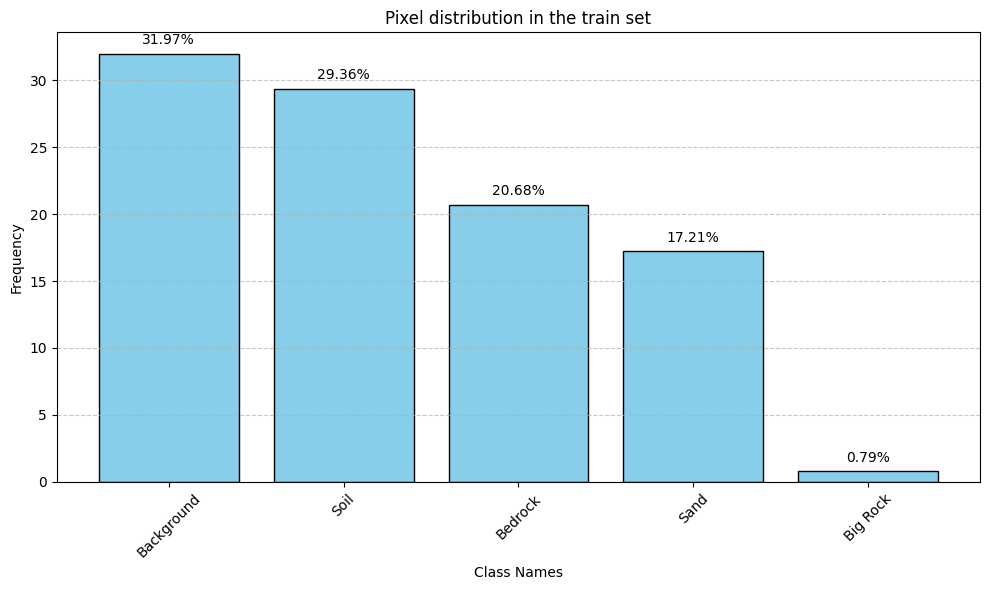

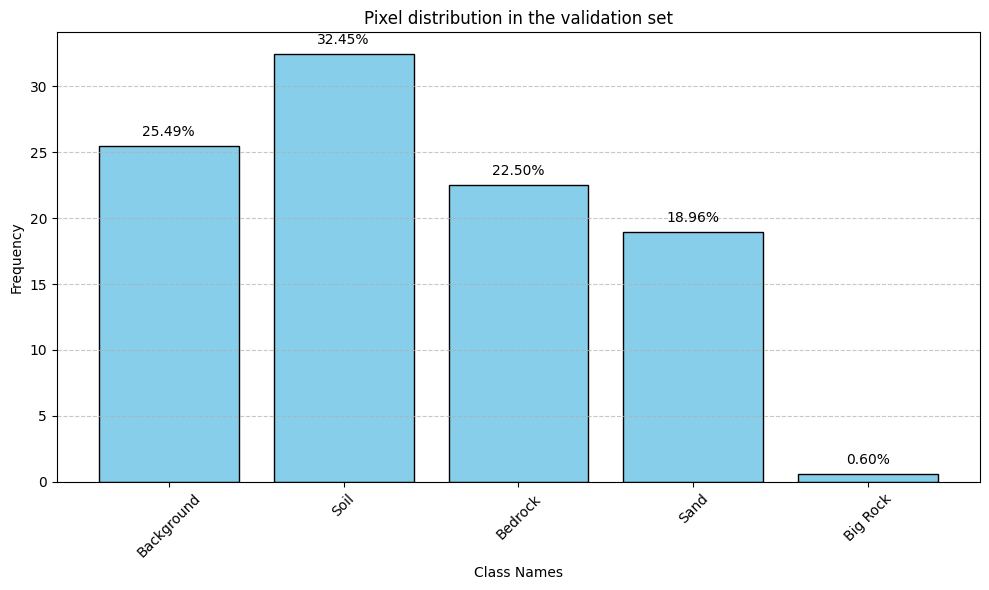

In [21]:
# Visualize the class distributions after the train/val split
visualize_class_distribution(y_train, labels, dataset="train set")
visualize_class_distribution(y_val, labels, dataset="validation set")

/tmp/ipykernel_23/2725607364.py:14: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = plt.cm.get_cmap("viridis", num_classes)


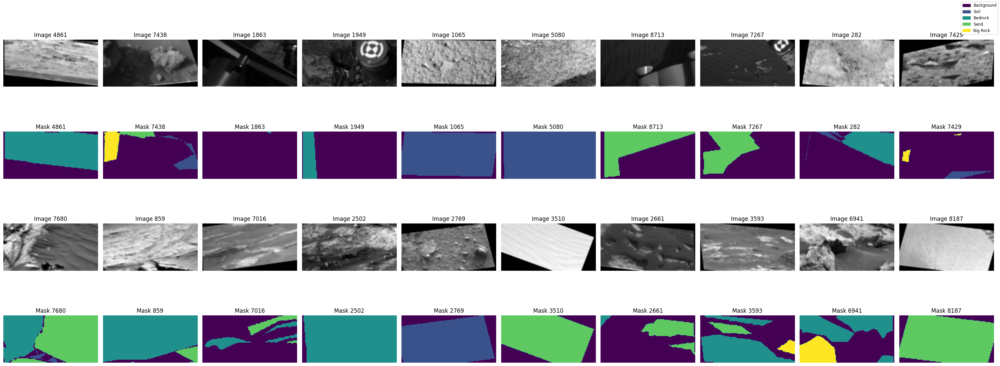

In [22]:
def visualize_random_augmented_images(X, y, num_images=20, num_classes=num_classes, labels=labels):
    """
    Visualize random images and their masks from the augmented dataset.

    Args:
    - X: Array of augmented images.
    - y: Array of augmented masks.
    - num_images: Number of images to display.
    - num_classes: Total number of classes for the colormap.
    - labels: Dictionary of class labels for the legend.
    """
    # Randomly select `num_images` indices
    selected_indices = random.sample(range(len(X)), min(num_images, len(X)))
    colormap = plt.cm.get_cmap("viridis", num_classes)
    legend_handles = [mpatches.Patch(color=colormap(i), label=labels[i]) for i in range(num_classes)]

    # Create subplots
    cols = 10  # Display 10 images per row
    rows = num_images // cols
    fig, axes = plt.subplots(2 * rows, cols, figsize=(cols * 3, rows * 6))

    for i, idx in enumerate(selected_indices):
        row = i // cols
        col = i % cols

        # Plot the image
        ax_image = axes[2 * row, col]
        ax_image.imshow(X[idx].squeeze(), cmap="gray")
        ax_image.axis("off")
        ax_image.set_title(f"Image {idx+1}")

        # Plot the corresponding mask
        ax_mask = axes[2 * row + 1, col]
        ax_mask.imshow(y[idx], cmap=colormap, vmin=0, vmax=num_classes - 1)
        ax_mask.axis("off")
        ax_mask.set_title(f"Mask {idx+1}")

    # Add a legend to the plot
    fig.legend(handles=legend_handles, loc="upper right", fontsize="small")
    plt.tight_layout()
    plt.show()

# Call the function to visualize 50 random augmented images and their masks
visualize_random_augmented_images(X_train_rescaled, y_train)


## 🛠️ Build the Model

In [23]:
# Maximum number of training epochs
EPOCHS = 1000

# Batch size used for training
BATCH_SIZE = 32

# Define the patience value for early stopping
PATIENCE = 30

VISUALIZED_FREQUENCY = 10

In [24]:
input_shape = X_train_rescaled.shape[1:]
num_classes = len(labels)

print(f"Input shape: {input_shape}")
print(f"Number of classes: {num_classes}")

Input shape: (64, 128, 1)
Number of classes: 5


In [25]:
def unet_block(input_tensor, filters, kernel_size=3, activation='relu', stack=2, name=''):
    # Initialise the input tensor
    x = input_tensor

    # Apply a sequence of Conv2D, Batch Normalisation, and Activation layers for the specified number of stacks
    for i in range(stack):
        x = tfkl.Conv2D(filters, kernel_size=kernel_size, padding='same', name=name + 'conv' + str(i + 1))(x)
        x = tfkl.BatchNormalization(name=name + 'bn' + str(i + 1))(x)
        x = tfkl.Activation(activation, name=name + 'activation' + str(i + 1))(x)

    # Return the transformed tensor
    return x

In [26]:
def build_unet_model(input_shape=input_shape, num_classes=num_classes, seed=SEED):
    input_layer = tfkl.Input(shape=input_shape, name='input_layer')

    # Downsampling path
    down_block_1 = unet_block(input_layer, 64, name='down_block1_')
    d1 = tfkl.MaxPooling2D()(down_block_1)

    down_block_2 = unet_block(d1, 128, name='down_block2_')
    d2 = tfkl.MaxPooling2D()(down_block_2)

    down_block_3 = unet_block(d2, 256, name='down_block3_')
    d3 = tfkl.MaxPooling2D()(down_block_3)

    # Bottleneck
    bottleneck = unet_block(d3, 512, name='bottleneck')

    # Upsampling path
    u1 = tfkl.UpSampling2D()(bottleneck)
    u1 = tfkl.Concatenate()([u1, down_block_3])
    u1 = unet_block(u1, 256, name='up_block1_')

    u2 = tfkl.UpSampling2D()(u1)
    u2 = tfkl.Concatenate()([u2, down_block_2])
    u2 = unet_block(u2, 128, name='up_block2_')

    u3 = tfkl.UpSampling2D()(u2)
    u3 = tfkl.Concatenate()([u3, down_block_1])
    u3 = unet_block(u3, 64, name='up_block3_')

    # Output Layer
    output_layer = tfkl.Conv2D(num_classes, kernel_size=1, padding='same', activation="softmax", name='output_layer')(u3)
    
    # Connect input and output through the Model class
    model = tf.keras.Model(inputs=input_layer, outputs=output_layer, name='UNet')

    return model

Model: "UNet"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 64, 128,   │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ down_block1_conv1   │ (None, 64, 128,   │        640 │ input_layer[0][0] │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ down_block1_bn1     │ (None, 64, 128,   │        256 │ down_block1_conv… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ down_block1_activa… │ (None, 64, 128,   │          0 │ down_block1_bn1[… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ down_block1_conv2   │ (None, 64, 128,   │     36,928 │ down_block1_acti… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ down_block1_bn2     │ (None, 64, 128,   │        256 │ down_block1_conv… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ down_block1_activa… │ (None, 64, 128,   │          0 │ down_block1_bn2[… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 32, 64,    │          0 │ down_block1_acti… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ down_block2_conv1   │ (None, 32, 64,    │     73,856 │ max_pooling2d[0]… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ down_block2_bn1     │ (None, 32, 64,    │        512 │ down_block2_conv… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ down_block2_activa… │ (None, 32, 64,    │          0 │ down_block2_bn1[… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ down_block2_conv2   │ (None, 32, 64,    │    147,584 │ down_block2_acti… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ down_block2_bn2     │ (None, 32, 64,    │        512 │ down_block2_conv… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ down_block2_activa… │ (None, 32, 64,    │          0 │ down_block2_bn2[… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 16, 32,    │          0 │ down_block2_acti… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ down_block3_conv1   │ (None, 16, 32,    │    295,168 │ max_pooling2d_1[… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ down_block3_bn1     │ (None, 16, 32,    │      1,024 │ down_block3_conv

 Total params: 7,793,285 (29.73 MB)

 Trainable params: 7,787,653 (29.71 MB)

 Non-trainable params: 5,632 (22.00 KB)

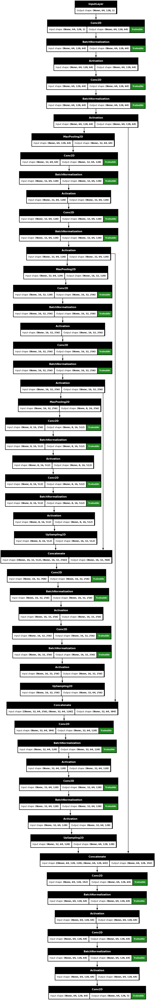

In [27]:
model = build_unet_model()

# Define the MeanIoU ignoring the background class
mean_iou = tfk.metrics.MeanIoU(num_classes=num_classes, ignore_class=0, sparse_y_pred=False, name="mean_iou")

# Compile the model
loss = tfk.losses.SparseCategoricalCrossentropy(ignore_class=0)
optimizer = tfk.optimizers.AdamW()
model.compile(loss=loss, optimizer=optimizer, metrics=["accuracy", mean_iou])

model.summary()

# Plot the model architecture
tfk.utils.plot_model(model, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)

## 🛠️ Train and Save the Model

In [28]:
# Visualization callback
class VizCallback(tf.keras.callbacks.Callback):
    def __init__(self, x, y, frequency=VISUALIZED_FREQUENCY):
        super().__init__()
        self.x = x
        self.y = y
        self.frequency = frequency

    def on_epoch_end(self, epoch, logs=None):
        if epoch % self.frequency == 0:  # Visualize only every "frequency" epochs
            x = tf.expand_dims(self.x, 0)
            pred = self.model.predict(x, verbose=0)
            y_pred = tf.math.argmax(pred, axis=-1)
            y_pred = y_pred.numpy()

            # Create colormap
            colormap = create_colormap(num_classes)

            plt.figure(figsize=(16, 4))

            # Input image
            plt.subplot(1, 3, 1)
            plt.imshow(x[0] * 255, cmap="gray")
            plt.title("Input Image")
            plt.axis('off')

            # Ground truth
            plt.subplot(1, 3, 2)
            plt.imshow(self.y, cmap=colormap, vmin=0, vmax=num_classes-1)
            plt.title("Ground Truth Mask")
            plt.axis('off')

            # Prediction
            plt.subplot(1, 3, 3)
            plt.imshow(y_pred[0], cmap=colormap, vmin=0, vmax=num_classes-1)
            plt.title("Predicted Mask")
            plt.axis('off')

            plt.tight_layout()
            plt.show()
            plt.close()

In [29]:
# Create an EarlyStopping callback
early_stopping = tfk.callbacks.EarlyStopping(
    monitor='val_mean_iou',
    mode='max',
    patience=PATIENCE,
    restore_best_weights=True
)

reduce_lr = tfk.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=PATIENCE//2,
    min_lr=1e-4
)

# Instatiate VizCallback
viz_callback = VizCallback(X_val_rescaled[10], y_val[10])

Epoch 1/1000


I0000 00:00:1734012853.219911      97 service.cc:145] XLA service 0x7b4558032f30 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1734012853.219980      97 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0


  2/281 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - accuracy: 0.1990 - loss: 2.1315 - mean_iou: 0.0585   

I0000 00:00:1734012867.271446      97 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


281/281 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - accuracy: 0.3512 - loss: 1.0965 - mean_iou: 0.2062

W0000 00:00:1734012893.827378      94 assert_op.cc:38] Ignoring Assert operator compile_loss/sparse_categorical_crossentropy/SparseSoftmaxCrossEntropyWithLogits/assert_equal_1/Assert/Assert
W0000 00:00:1734012894.994791      96 assert_op.cc:38] Ignoring Assert operator compile_loss/sparse_categorical_crossentropy/SparseSoftmaxCrossEntropyWithLogits/assert_equal_1/Assert/Assert
/tmp/ipykernel_23/837677969.py:3: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  return plt.cm.get_cmap("viridis", num_classes)


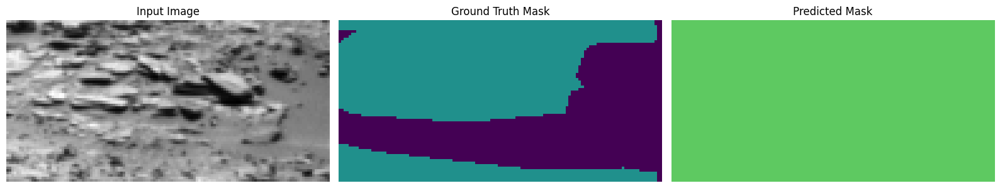

281/281 ━━━━━━━━━━━━━━━━━━━━ 54s 115ms/step - accuracy: 0.3513 - loss: 1.0960 - mean_iou: 0.2064 - val_accuracy: 0.1894 - val_loss: 6.3841 - val_mean_iou: 0.0635 - learning_rate: 0.0010
Epoch 2/1000
281/281 ━━━━━━━━━━━━━━━━━━━━ 25s 90ms/step - accuracy: 0.4688 - loss: 0.7502 - mean_iou: 0.3182 - val_accuracy: 0.4617 - val_loss: 1.2592 - val_mean_iou: 0.3349 - learning_rate: 0.0010
Epoch 3/1000
281/281 ━━━━━━━━━━━━━━━━━━━━ 25s 90ms/step - accuracy: 0.5244 - loss: 0.5943 - mean_iou: 0.3907 - val_accuracy: 0.4840 - val_loss: 1.0171 - val_mean_iou: 0.4165 - learning_rate: 0.0010
Epoch 4/1000
281/281 ━━━━━━━━━━━━━━━━━━━━ 25s 90ms/step - accuracy: 0.5450 - loss: 0.5322 - mean_iou: 0.4244 - val_accuracy: 0.4689 - val_loss: 1.2097 - val_mean_iou: 0.3785 - learning_rate: 0.0010
Epoch 5/1000
281/281 ━━━━━━━━━━━━━━━━━━━━ 25s 89ms/step - accuracy: 0.5597 - loss: 0.4712 - mean_iou: 0.5644 - val_accuracy: 0.6100 - val_loss: 0.5041 - val_mean_iou: 0.5898 - learning_rate: 0.0010
Epoch 6/1000
281/281 ━

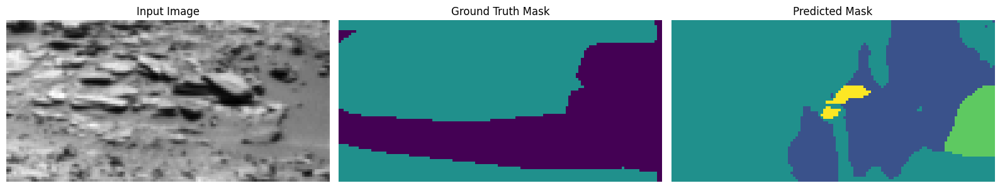

281/281 ━━━━━━━━━━━━━━━━━━━━ 26s 91ms/step - accuracy: 0.6015 - loss: 0.3138 - mean_iou: 0.6825 - val_accuracy: 0.6719 - val_loss: 0.2874 - val_mean_iou: 0.7103 - learning_rate: 0.0010
Epoch 12/1000
281/281 ━━━━━━━━━━━━━━━━━━━━ 25s 90ms/step - accuracy: 0.6077 - loss: 0.2870 - mean_iou: 0.7055 - val_accuracy: 0.6408 - val_loss: 0.4697 - val_mean_iou: 0.6503 - learning_rate: 0.0010
Epoch 13/1000
281/281 ━━━━━━━━━━━━━━━━━━━━ 25s 90ms/step - accuracy: 0.6145 - loss: 0.2625 - mean_iou: 0.6706 - val_accuracy: 0.6604 - val_loss: 0.3521 - val_mean_iou: 0.6855 - learning_rate: 0.0010
Epoch 14/1000
281/281 ━━━━━━━━━━━━━━━━━━━━ 25s 90ms/step - accuracy: 0.6201 - loss: 0.2418 - mean_iou: 0.7554 - val_accuracy: 0.6580 - val_loss: 0.3663 - val_mean_iou: 0.7001 - learning_rate: 0.0010
Epoch 15/1000
281/281 ━━━━━━━━━━━━━━━━━━━━ 25s 90ms/step - accuracy: 0.6256 - loss: 0.2180 - mean_iou: 0.7806 - val_accuracy: 0.6005 - val_loss: 0.5579 - val_mean_iou: 0.5697 - learning_rate: 0.0010
Epoch 16/1000
281/2

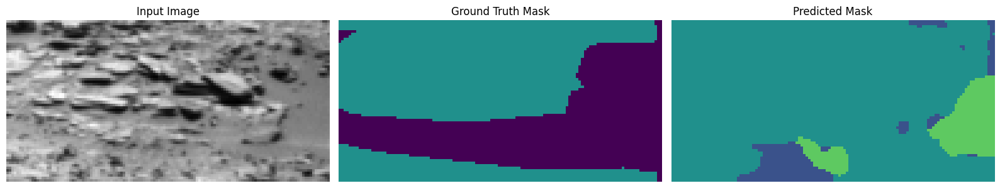

281/281 ━━━━━━━━━━━━━━━━━━━━ 26s 91ms/step - accuracy: 0.6508 - loss: 0.1193 - mean_iou: 0.8818 - val_accuracy: 0.6724 - val_loss: 0.3425 - val_mean_iou: 0.7736 - learning_rate: 0.0010
Epoch 22/1000
281/281 ━━━━━━━━━━━━━━━━━━━━ 25s 90ms/step - accuracy: 0.6540 - loss: 0.1068 - mean_iou: 0.8980 - val_accuracy: 0.6593 - val_loss: 0.4177 - val_mean_iou: 0.7754 - learning_rate: 0.0010
Epoch 23/1000
281/281 ━━━━━━━━━━━━━━━━━━━━ 25s 90ms/step - accuracy: 0.6549 - loss: 0.1027 - mean_iou: 0.9003 - val_accuracy: 0.6517 - val_loss: 0.4372 - val_mean_iou: 0.7633 - learning_rate: 0.0010
Epoch 24/1000
281/281 ━━━━━━━━━━━━━━━━━━━━ 25s 90ms/step - accuracy: 0.6591 - loss: 0.0863 - mean_iou: 0.9170 - val_accuracy: 0.6453 - val_loss: 0.5032 - val_mean_iou: 0.7663 - learning_rate: 0.0010
Epoch 25/1000
281/281 ━━━━━━━━━━━━━━━━━━━━ 25s 90ms/step - accuracy: 0.6614 - loss: 0.0758 - mean_iou: 0.9277 - val_accuracy: 0.6202 - val_loss: 0.7618 - val_mean_iou: 0.7335 - learning_rate: 0.0010
Epoch 26/1000
281/2

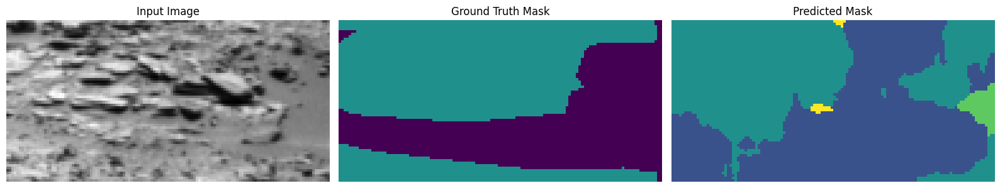

281/281 ━━━━━━━━━━━━━━━━━━━━ 26s 92ms/step - accuracy: 0.6761 - loss: 0.0156 - mean_iou: 0.9860 - val_accuracy: 0.6863 - val_loss: 0.3977 - val_mean_iou: 0.8558 - learning_rate: 5.0000e-04
Epoch 32/1000
281/281 ━━━━━━━━━━━━━━━━━━━━ 25s 90ms/step - accuracy: 0.6762 - loss: 0.0145 - mean_iou: 0.9868 - val_accuracy: 0.6858 - val_loss: 0.4003 - val_mean_iou: 0.8534 - learning_rate: 5.0000e-04
Epoch 33/1000
281/281 ━━━━━━━━━━━━━━━━━━━━ 25s 90ms/step - accuracy: 0.6766 - loss: 0.0126 - mean_iou: 0.9882 - val_accuracy: 0.6848 - val_loss: 0.4254 - val_mean_iou: 0.8447 - learning_rate: 5.0000e-04
Epoch 34/1000
281/281 ━━━━━━━━━━━━━━━━━━━━ 25s 90ms/step - accuracy: 0.6755 - loss: 0.0171 - mean_iou: 0.9832 - val_accuracy: 0.6804 - val_loss: 0.3761 - val_mean_iou: 0.8322 - learning_rate: 5.0000e-04
Epoch 35/1000
281/281 ━━━━━━━━━━━━━━━━━━━━ 25s 90ms/step - accuracy: 0.6746 - loss: 0.0205 - mean_iou: 0.9794 - val_accuracy: 0.6841 - val_loss: 0.3912 - val_mean_iou: 0.8429 - learning_rate: 5.0000e-04

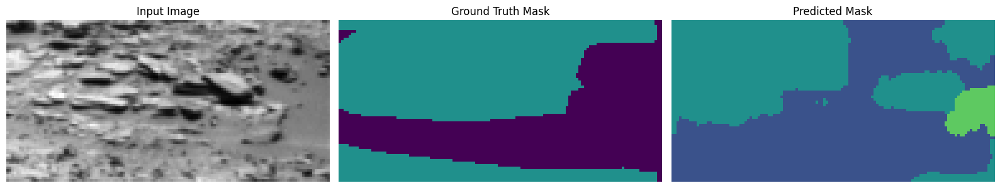

281/281 ━━━━━━━━━━━━━━━━━━━━ 26s 91ms/step - accuracy: 0.6776 - loss: 0.0073 - mean_iou: 0.9925 - val_accuracy: 0.6849 - val_loss: 0.4791 - val_mean_iou: 0.8553 - learning_rate: 5.0000e-04
Epoch 42/1000
281/281 ━━━━━━━━━━━━━━━━━━━━ 25s 90ms/step - accuracy: 0.6778 - loss: 0.0067 - mean_iou: 0.9929 - val_accuracy: 0.6793 - val_loss: 0.5053 - val_mean_iou: 0.8317 - learning_rate: 2.5000e-04
Epoch 43/1000
281/281 ━━━━━━━━━━━━━━━━━━━━ 25s 90ms/step - accuracy: 0.6780 - loss: 0.0056 - mean_iou: 0.9943 - val_accuracy: 0.6857 - val_loss: 0.4913 - val_mean_iou: 0.8652 - learning_rate: 2.5000e-04
Epoch 44/1000
281/281 ━━━━━━━━━━━━━━━━━━━━ 25s 90ms/step - accuracy: 0.6783 - loss: 0.0041 - mean_iou: 0.9957 - val_accuracy: 0.6862 - val_loss: 0.5062 - val_mean_iou: 0.8628 - learning_rate: 2.5000e-04
Epoch 45/1000
281/281 ━━━━━━━━━━━━━━━━━━━━ 25s 90ms/step - accuracy: 0.6785 - loss: 0.0034 - mean_iou: 0.9965 - val_accuracy: 0.6867 - val_loss: 0.5196 - val_mean_iou: 0.8637 - learning_rate: 2.5000e-04

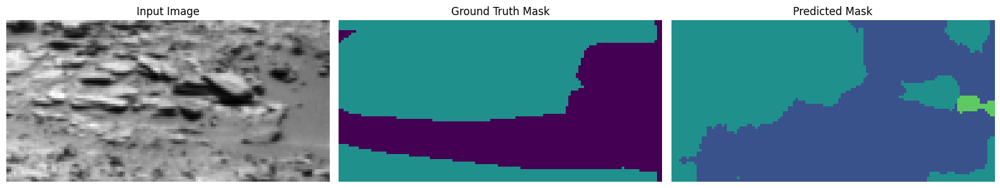

281/281 ━━━━━━━━━━━━━━━━━━━━ 26s 91ms/step - accuracy: 0.6785 - loss: 0.0033 - mean_iou: 0.9966 - val_accuracy: 0.6877 - val_loss: 0.5160 - val_mean_iou: 0.8645 - learning_rate: 2.5000e-04
Epoch 52/1000
281/281 ━━━━━━━━━━━━━━━━━━━━ 25s 90ms/step - accuracy: 0.6786 - loss: 0.0027 - mean_iou: 0.9970 - val_accuracy: 0.6861 - val_loss: 0.5429 - val_mean_iou: 0.8657 - learning_rate: 2.5000e-04
Epoch 53/1000
281/281 ━━━━━━━━━━━━━━━━━━━━ 25s 90ms/step - accuracy: 0.6787 - loss: 0.0022 - mean_iou: 0.9975 - val_accuracy: 0.6872 - val_loss: 0.5414 - val_mean_iou: 0.8638 - learning_rate: 2.5000e-04
Epoch 54/1000
281/281 ━━━━━━━━━━━━━━━━━━━━ 25s 90ms/step - accuracy: 0.6787 - loss: 0.0021 - mean_iou: 0.9978 - val_accuracy: 0.6867 - val_loss: 0.5482 - val_mean_iou: 0.8581 - learning_rate: 2.5000e-04
Epoch 55/1000
281/281 ━━━━━━━━━━━━━━━━━━━━ 25s 90ms/step - accuracy: 0.6766 - loss: 0.0113 - mean_iou: 0.9883 - val_accuracy: 0.6858 - val_loss: 0.4384 - val_mean_iou: 0.8569 - learning_rate: 2.5000e-04

In [30]:
# Train the model with early stopping callback
history = model.fit(
    x=X_train_rescaled,
    y=y_train,
    batch_size=BATCH_SIZE,
    epochs=EPOCHS,
    validation_data=(X_val_rescaled, y_val),
    callbacks=[early_stopping, reduce_lr, viz_callback],
).history

# Calculate and print the final validation accuracy
final_val_accuracy = round(history['val_accuracy'][-PATIENCE-1] * 100, 2)
print(f'Final validation accuracy: {final_val_accuracy}%')

# Calculate and print the final validation mean iou
final_val_mean_iou = round(history['val_mean_iou'][-PATIENCE-1] * 100, 2)
print(f'Final validation mean iou: {final_val_mean_iou}%')

## Save the model

In [31]:
# Change this variable to change the name of the .keras file
MODEL_NAME = 'model_v15_cosimo'

# Save the trained model to a file with the accuracy and mean iou included in the filename
model_filename = MODEL_NAME+'_'+str(final_val_accuracy)+'_'+str(final_val_mean_iou)+'.keras'
model.save(model_filename)

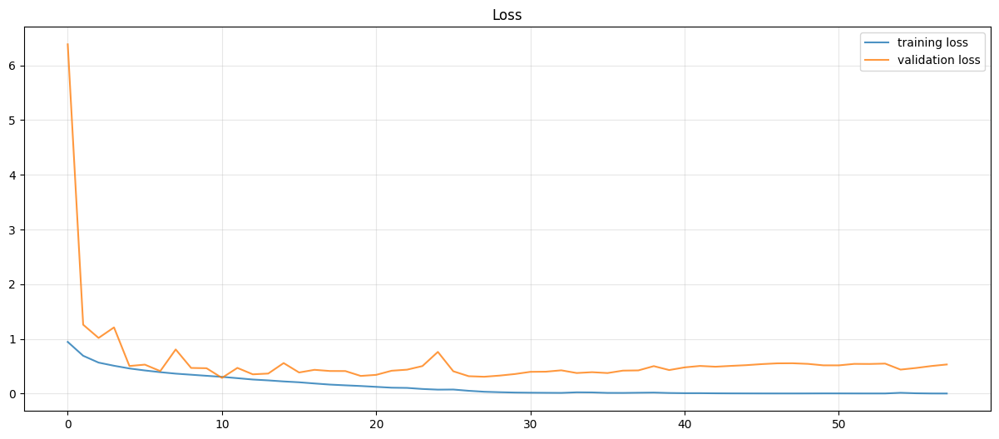

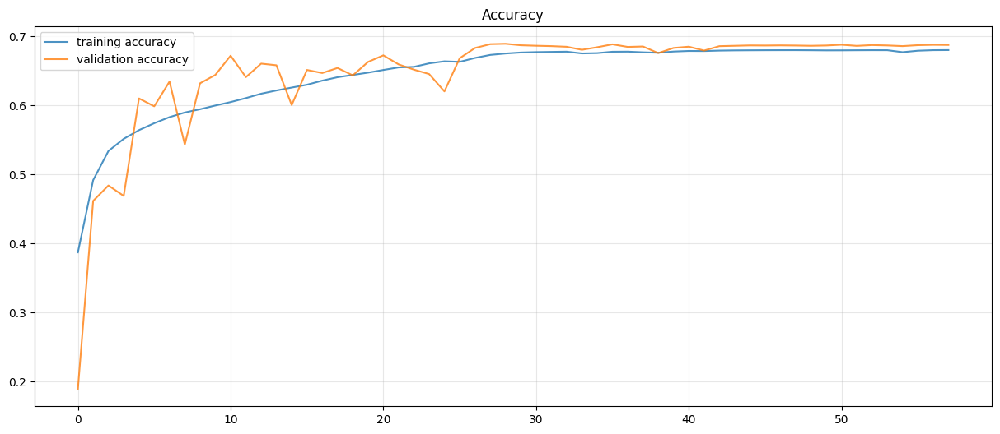

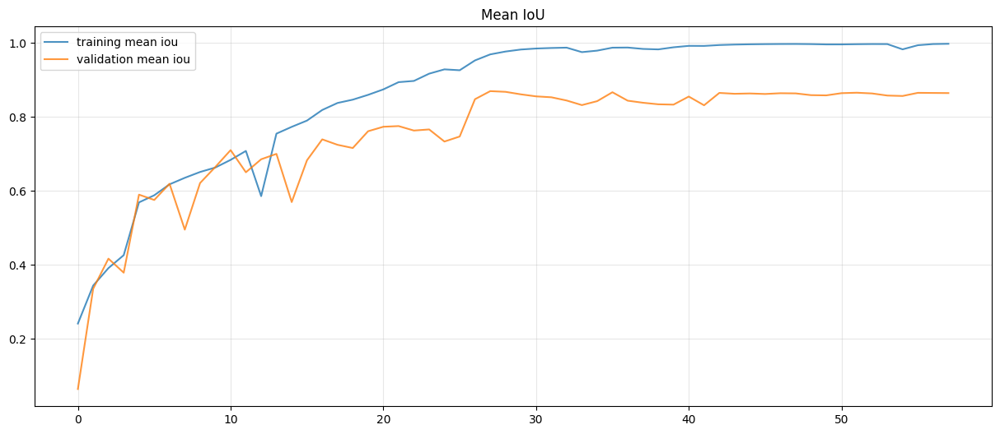

In [32]:
start_epoch = 0

# Plot training and validation loss
plt.figure(figsize=(15, 6))
plt.plot(history['loss'][start_epoch:], label='training loss', alpha=.8)
plt.plot(history['val_loss'][start_epoch:], label='validation loss', alpha=.8)
plt.title('Loss')
plt.legend()
plt.grid(alpha=.3)

# Plot training and validation accuracy
plt.figure(figsize=(15, 6))
plt.plot(history['accuracy'][start_epoch:], label='training accuracy', alpha=.8)
plt.plot(history['val_accuracy'][start_epoch:], label='validation accuracy', alpha=.8)
plt.title('Accuracy')
plt.legend()
plt.grid(alpha=.3)

# Plot training and validation mean iou
plt.figure(figsize=(15, 6))
plt.plot(history['mean_iou'][start_epoch:], label='training mean iou', alpha=.8)
plt.plot(history['val_mean_iou'][start_epoch:], label='validation mean iou', alpha=.8)
plt.title('Mean IoU')
plt.legend()
plt.grid(alpha=.3)

plt.show()

In [33]:
def visualize_confusion_matrix(y_true, y_pred, labels):
    y_true = y_true.flatten()
    y_pred = y_pred.flatten()
    
    # Calculate and display val set accuracy
    accuracy = accuracy_score(y_true, y_pred)
    print(f'Accuracy score over the val set: {round(accuracy, 4)}')

    # Calculate and display val set precision
    precision = precision_score(y_true, y_pred, average='weighted')
    print(f'Precision score over the val set: {round(precision, 4)}')

    # Calculate and display val set recall
    recall = recall_score(y_true, y_pred, average='weighted')
    print(f'Recall score over the val set: {round(recall, 4)}')

    # Calculate and display val set F1 score
    f1 = f1_score(y_true, y_pred, average='weighted')
    print(f'F1 score over the val set: {round(f1, 4)}')

    # Compute the confusion matrix
    cm = confusion_matrix(y_true, y_pred)

    # Combine numbers and percentages into a single string for annotation
    annot = np.array([f"{num}" for num in cm.flatten()]).reshape(cm.shape)

    # Plot the confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm.T, annot=annot, fmt='', xticklabels=list(labels.values()), yticklabels=list(labels.values()), cmap='Blues')
    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')
    plt.show()


def visualize_worst_iou_images(y_true, y_pred, labels, n_images=20, size=2):
    """
    Visualizes the images with the worst IoU scores using tf.keras.metrics.MeanIoU.

    Args:
        y_true (numpy.ndarray): Array of ground truth labels (batch_size, H, W).
        y_pred (numpy.ndarray): Array of predicted labels (batch_size, H, W).
        labels (dict): Dictionary mapping class indices to class names.
        num_classes (int): Number of unique classes.
        n_images (int): Number of worst IoU images to display.
    """ 
    # Create MeanIoU metric object
    iou_metric = tfk.metrics.MeanIoU(num_classes=num_classes, ignore_class=0)
    
    # Initialize list to store IoU scores
    iou_scores = []

    # Compute IoU for each image in the batch
    for i in range(y_true.shape[0]):
        # Reset the metric state for each image
        iou_metric.reset_state()
        
        # Update state for ground truth and prediction
        iou_metric.update_state(y_true[i], y_pred[i])
        
        # Compute the IoU for this image
        iou = iou_metric.result().numpy()  # Convert the result to a NumPy value
        iou_scores.append(iou)

    # Convert to a numpy array for easy manipulation
    iou_scores = np.array(iou_scores)
    
    # Get the indices of the worst IoU images
    worst_iou_indices = np.argsort(iou_scores)[:n_images]

    # Create colormap
    colormap = create_colormap(num_classes)
    
    # Plot the worst IoU images
    fig, axes = plt.subplots(n_images, 3, figsize=(size * 6, size * n_images))
    
    for i, idx in enumerate(worst_iou_indices):
        ax0 = axes[i][0]
        ax0.imshow(X_val[idx], cmap='gray')
        ax0.set_xticks([])
        ax0.set_yticks([])
        ax0.set_title("Input Image")
        
        ax1 = axes[i][1]
        ax1.imshow(y_true[idx], cmap=colormap, vmin=0, vmax=num_classes-1)
        ax1.set_xticks([])
        ax1.set_yticks([])
        ax1.set_title("Ground Truth Mask")

        ax2 = axes[i][2]
        ax2.imshow(y_pred[idx], cmap=colormap, vmin=0, vmax=num_classes-1)
        ax2.set_xticks([])
        ax2.set_yticks([])
        ax2.set_title(f"Predicted Mask (IoU: {iou_scores[idx]:.2f})")
    
    plt.tight_layout()
    plt.show()
    plt.close()

17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step
Accuracy score over the val set: 0.6886


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Precision score over the val set: 0.5189
Recall score over the val set: 0.6886
F1 score over the val set: 0.5902


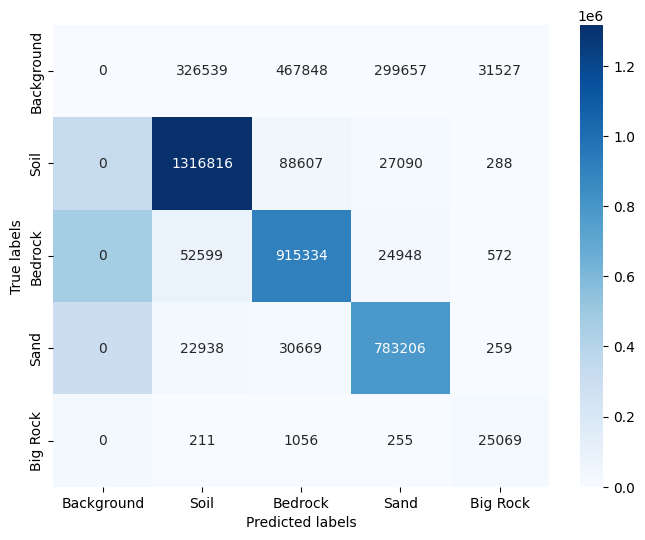

/tmp/ipykernel_23/837677969.py:3: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  return plt.cm.get_cmap("viridis", num_classes)


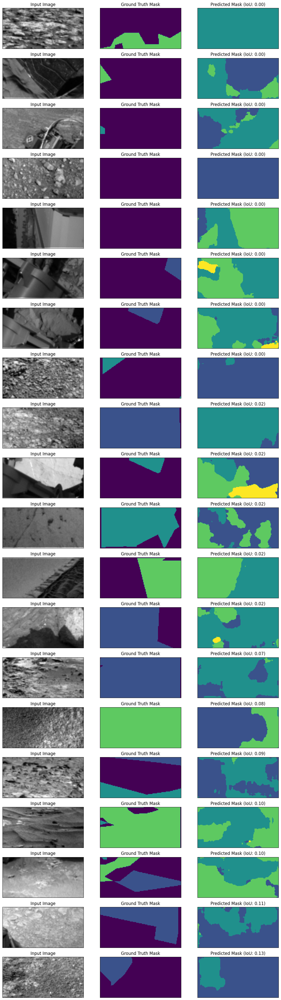

In [38]:
y_val_pred = model.predict(X_val_rescaled)
y_val_pred = np.argmax(y_val_pred, axis=-1)

visualize_confusion_matrix(y_val, y_val_pred, labels)
visualize_worst_iou_images(y_val, y_val_pred, labels)

## 📊 Prepare Your Submission

In our Kaggle competition, submissions are made as `csv` files. To create a proper `csv` file, you need to flatten your predictions and include an `id` column as the first column of your dataframe. To maintain consistency between your results and our solution, please avoid shuffling the test set. The code below demonstrates how to prepare the `csv` file from your model predictions.

In [ ]:
# If model_filename is not defined, load the most recent model from Google Drive
if "model_filename" not in globals() or model_filename is None:
    files = [f for f in os.listdir('.') if os.path.isfile(f) and f.startswith('model_') and f.endswith('.keras')]
    files.sort(key=lambda x: os.path.getmtime(x), reverse=True)
    if files:
        model_filename = files[0]
    else:
        raise FileNotFoundError("No model files found in the current directory.")

In [39]:
model = tfk.models.load_model(model_filename)
print(f"Model loaded from {model_filename}")

Model loaded from model_v15_cosimo_68.86_87.0.keras


In [42]:
preds = model.predict(X_test_rescaled)
preds = np.argmax(preds, axis=-1)
print(f"Predictions shape: {preds.shape}")

314/314 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step
Predictions shape: (10022, 64, 128)


In [43]:
def y_to_df(y) -> pd.DataFrame:
    """Converts segmentation predictions into a DataFrame format for Kaggle."""
    n_samples = len(y)
    y_flat = y.reshape(n_samples, -1)
    df = pd.DataFrame(y_flat)
    df["id"] = np.arange(n_samples)
    cols = ["id"] + [col for col in df.columns if col != "id"]
    return df[cols]

In [44]:
# Create and download the csv submission file
model_name = model_filename.replace(".keras", "")
submission_filename = f"{model_name}.csv"
submission_df = y_to_df(preds)
submission_df.to_csv(submission_filename, index=False)

# from google.colab import files
# files.download(submission_filename)

# Modified by GradientGang
- Bordin Luca 📧 luca1.bordin@mail.polimi.it
- Negri Cosimo Giovanni 📧 cosimogiovanni.negri@mail.polimi.it
- Menegale Mattia 📧 mattia.menegale@mail.polimi.it

# Credits for the base version of this notebook 
<img src="https://airlab.deib.polimi.it/wp-content/uploads/2019/07/airlab-logo-new_cropped.png" width="350">

<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/9/95/Instagram_logo_2022.svg/800px-Instagram_logo_2022.svg.png" width="15"> **Instagram:** https://www.instagram.com/airlab_polimi/

<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/8/81/LinkedIn_icon.svg/2048px-LinkedIn_icon.svg.png" width="15"> **LinkedIn:** https://www.linkedin.com/company/airlab-polimi/
___
Credits: Alberto Archetti 📧 alberto.archetti@polito.it





```
   Copyright 2024 Alberto Archetti

   Licensed under the Apache License, Version 2.0 (the "License");
   you may not use this file except in compliance with the License.
   You may obtain a copy of the License at

       http://www.apache.org/licenses/LICENSE-2.0

   Unless required by applicable law or agreed to in writing, software
   distributed under the License is distributed on an "AS IS" BASIS,
   WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
   See the License for the specific language governing permissions and
   limitations under the License.
```